<b>A brief Overview of the whole project <b><br>
In this part of the assignment I will be discussing question 1 of the problem statement.
Things I've assumed(and followed) while modelling gt(x) <br>
    1. I think its a gross oversimplification of what the actual model might look like, and because I did not have any actual gt(x)(also the fact to emulate an actual gt(x) the curve will dynamically change with time), thus considering t to be constant in time while I map gt(x) is fairly resonable.<br>
    2. I am finding 2 different equations(rather an intuitive (backed by facts a bit as well) form of this equation which is my own interpretation based on observations), one being for the buy side and the other being for the sell side.<br>
    3. The final form is not emulated from any research papers in this field but rather a sneek peek into my own understanding and application of mathematics, statistics and the basic optimization I've used.<br>

So keeping these into mind, lets get started.<br>
Off the top of my head, I could think of a couple of things which could help me make the best guesstimation for the given function:<br>
    1. I'm given a very rich dataset, which going through the dataset it was very obvious that because I have such a detailed map of the dataset at any given time, why not use the actual thing to find a baseline ğt(x) which should be pretty close to the actual dataset. Let us emulate the function for any given moment in time. Let us use that to create a baseline, which I've programmed in the next line.<br>

Below is the function which I'll be using to find the value of gt(x) at any given time t, for some given x.

In [3]:
def compute_gtx_from_orderbook(x, prices, sizes):
    """
    Compute VWAP (average execution price) for a trade of size x.

    Parameters:
    - x: int, trade size
    - prices: list of floats, sorted prices (ascending for buys, descending for sells)
    - sizes: list of ints, available sizes at each price level

    Returns:
    - avg_price: float or None if not enough liquidity
    """
    x_remaining = x
    total_cost = 0

    for price, size in zip(prices, sizes):
        if x_remaining <= 0:
            break
        take_size = min(size, x_remaining)
        total_cost += take_size * price
        x_remaining -= take_size

    if x_remaining > 0:
        return None  # Not enough depth in the book

    return total_cost / x


Below is the function which helps in data structuring for finding the gtx

In [4]:
def extract_orderbook_row(df, row_index):
    """
    Extract ask/bid price and size arrays from a single row of a DataFrame.

    Parameters:
    - df: pandas DataFrame with columns: ask_px_0i, ask_sz_0i, bid_px_0i, bid_sz_0i (i = 0 to 9)
    - row_index: int, the index of the row to extract

    Returns:
    - ask_px: list of floats
    - ask_sz: list of ints
    - bid_px: list of floats
    - bid_sz: list of ints
    """
    row = df.iloc[row_index]
    ask_px = [row[f'ask_px_0{i}'] / 1e9 for i in range(10)]
    ask_sz = [row[f'ask_sz_0{i}'] for i in range(10)]
    bid_px = [row[f'bid_px_0{i}'] / 1e9 for i in range(10)]
    bid_sz = [row[f'bid_sz_0{i}'] for i in range(10)]
    return ask_px, ask_sz, bid_px, bid_sz


Plotting the actual function using the value below

In [10]:
def compute_gtx_series_from_snapshot(df, row_index, max_x=500, step=1):
    """
    Compute buy-side and sell-side gₜ(x) series from a single order book snapshot.

    Parameters:
    - df: pandas DataFrame with order book data
    - row_index: int, row of the snapshot to analyze
    - max_x: int, max trade size
    - step: int, trade size increment

    Returns:
    - trade_sizes: list of trade sizes
    - gt_buy: list of gₜ(x) for buy side
    - gt_sell: list of gₜ(x) for sell side
    """
    # Extract book from row
    ask_px, ask_sz, bid_px, bid_sz = extract_orderbook_row(df, row_index)
    mid_price = (ask_px[0] + bid_px[0]) / 2

    trade_sizes = np.arange(step, max_x + 1, step)
    gt_buy, gt_sell = [], []

    for x in trade_sizes:
        buy_price = compute_gtx_from_orderbook(x, ask_px, ask_sz)
        sell_price = compute_gtx_from_orderbook(x, bid_px, bid_sz)

        gt_buy.append(buy_price - mid_price if buy_price else np.nan)
        gt_sell.append(mid_price - sell_price if sell_price else np.nan)

    return trade_sizes, gt_buy, gt_sell


In [7]:
def plot_gtx_series(trade_sizes, gt_buy, gt_sell, row_index=None):
    """
    Plot gₜ(x) slippage curves from precomputed series.

    Parameters:
    - trade_sizes: list of trade sizes
    - gt_buy: list of buy-side gₜ(x) values
    - gt_sell: list of sell-side gₜ(x) values
    - row_index: optional int, for labeling (e.g., snapshot number)
    """
    plt.figure(figsize=(10, 6))
    plt.plot(trade_sizes, gt_buy, label='Buy-side gₜ(x)', color='green', marker='o')
    plt.plot(trade_sizes, gt_sell, label='Sell-side gₜ(x)', color='red', marker='o')
    plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
    plt.title(f'gₜ(x) Slippage Curve{f" (row {row_index})" if row_index is not None else ""}')
    plt.xlabel('Trade Size x (shares)')
    plt.ylabel('Slippage per Share gₜ(x)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


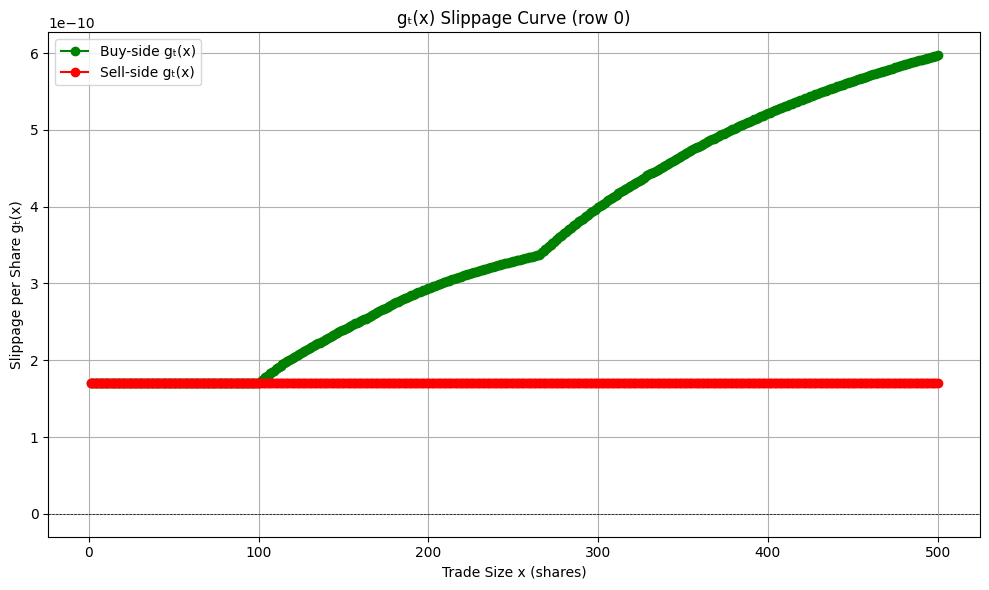

In [11]:
# Assuming your order book snapshot is loaded in df
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("CRWV/CRWV_2025-04-10 00:00:00+00:00.csv")

# Compute gₜ(x) from row 0
trade_sizes, gt_buy, gt_sell = compute_gtx_series_from_snapshot(df, row_index=0)

# Plot it
plot_gtx_series(trade_sizes, gt_buy, gt_sell, row_index=0)


So this is what our buy and sell side basline ğt(x) would look like.
I think this is a pretty solid baseline to start working with.
Now we know that there are multiple different factors which will be interfering with this function,

In [12]:
import pandas as pd
import numpy as np

# ---------- Load your raw CSV file ----------
df = pd.read_csv("CRWV/CRWV_2025-04-04 00:00:00+00:00.csv")  # replace with your filename

# Convert timestamps from nanoseconds to datetime
df['ts_event'] = pd.to_datetime(df['ts_event'], unit='ns')

# Convert prices to float format (divide by 1e9)
df['price'] = df['price'] / 1e9
df['bid_px_000'] = df['bid_px_00'] / 1e9
df['bid_px_00'] = df['bid_px_00'] / 1e9

# Compute mid-price
df['mid_price'] = (df['bid_px_00'] + df['bid_px_00']) / 2

# ---------- Set time index for resampling ----------
df.set_index('ts_event', inplace=True)

# ---------- Trade Volume (v_t) ----------
df_trades = df[df['action'] == 'T']
volume_per_min = df_trades['size'].resample('1min').sum().rename('v_t')

# ---------- Average Trade Size ----------
avg_trade_size = df_trades['size'].resample('1min').mean().rename('avg_trade_size')

# ---------- Volatility (std dev of mid-price returns) ----------
# Log returns of mid-price
df_mid = df[['mid_price']].resample('1min').last().dropna()
returns = np.log(df_mid / df_mid.shift(1))
volatility = returns['mid_price'].rolling(window=5).std().rename('volatility')

# ---------- Spread ----------
spread = (df['bid_px_00'] - df['bid_px_00']).resample('1min').mean().rename('spread')

# ---------- Order Book Imbalance ----------
imbalance = ((df['bid_sz_00'] - df['ask_sz_00']) / 
             (df['bid_sz_00'] + df['ask_sz_00']).replace(0, np.nan))
imbalance_per_min = imbalance.resample('1min').mean().rename('imbalance')

# ---------- Trade Direction Bias ----------
# +1 for buy-initiated trades, -1 for sell-initiated
df_trades['direction'] = df_trades['side'].map({'Bid': 1, 'Ask': -1})
trade_direction = df_trades['direction'].resample('1min').sum().rename('net_direction')

# ---------- Merge all features ----------
features = pd.concat([
    volume_per_min,
    avg_trade_size,
    volatility,
    spread,
    imbalance_per_min,
    trade_direction
], axis=1).dropna()

# ---------- Optional: Compute η_t (market impact coefficient) ----------
features['eta_t'] = features['volatility'] / features['v_t']

# ---------- Inspect result ----------
print(features.head())


                             v_t  avg_trade_size  volatility  spread  \
ts_event                                                               
2025-04-04 13:35:00+00:00   6740       78.372093    0.012859     0.0   
2025-04-04 13:36:00+00:00   9704       93.307692    0.007968     0.0   
2025-04-04 13:37:00+00:00  20034       82.106557    0.010232     0.0   
2025-04-04 13:38:00+00:00   9693       85.778761    0.006775     0.0   
2025-04-04 13:39:00+00:00  11167      107.375000    0.006793     0.0   

                           imbalance  net_direction         eta_t  
ts_event                                                           
2025-04-04 13:35:00+00:00  -0.152892            0.0  1.907803e-06  
2025-04-04 13:36:00+00:00  -0.145884            0.0  8.211336e-07  
2025-04-04 13:37:00+00:00  -0.344509            0.0  5.107385e-07  
2025-04-04 13:38:00+00:00  -0.399225            0.0  6.990013e-07  
2025-04-04 13:39:00+00:00  -0.140104            0.0  6.083071e-07  


Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000483 to 0.021273

Highest Volatility Minute: 2025-04-03 13:33:00+00:00
Volatility: 0.021273

Lowest Volatility Minute: 2025-04-03 13:59:00+00:00
Volatility: 0.000483

Step 2: Extracting all orderbook snapshots...
High volatility minute: 1298 snapshots
Low volatility minute: 296 snapshots

Calculating gₜ(x) for HIGH VOLATILITY minute...
Successfully calculated gₜ(x) for 1298 snapshots

Calculating gₜ(x) for LOW VOLATILITY minute...
Successfully calculated gₜ(x) for 296 snapshots

Step 3: Calculating averages...


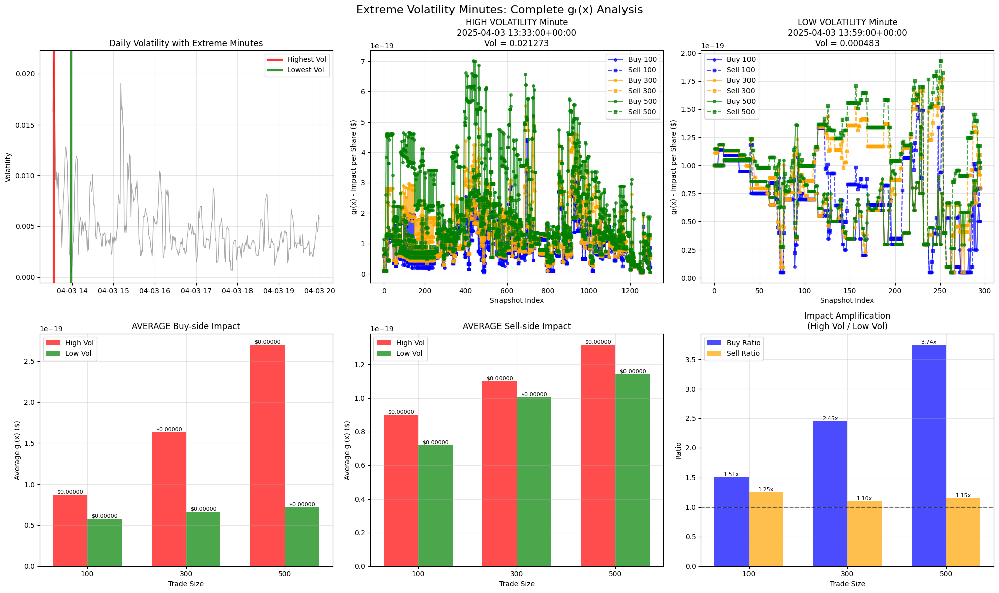


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-03 13:33:00+00:00
Volatility: 0.021273
Number of snapshots: 1298

LOWEST VOLATILITY MINUTE: 2025-04-03 13:59:00+00:00
Volatility: 0.000483
Number of snapshots: 296

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.51x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.25x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.45x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.10x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.74x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.15x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000507 to 0.021878

Highest Volatility Minute: 2025-04-04 13:32:00+00:00
Volatility:

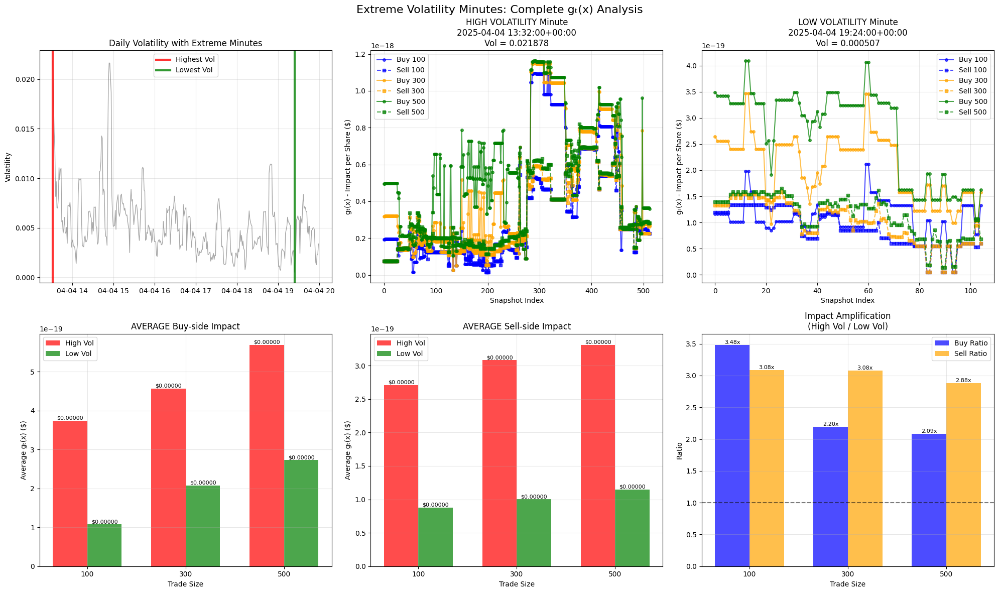


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-04 13:32:00+00:00
Volatility: 0.021878
Number of snapshots: 513

LOWEST VOLATILITY MINUTE: 2025-04-04 19:24:00+00:00
Volatility: 0.000507
Number of snapshots: 105

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.48x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.08x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.20x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.08x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.09x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.88x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000748 to 0.030386

Highest Volatility Minute: 2025-04-07 14:19:00+00:00
Volatility: 

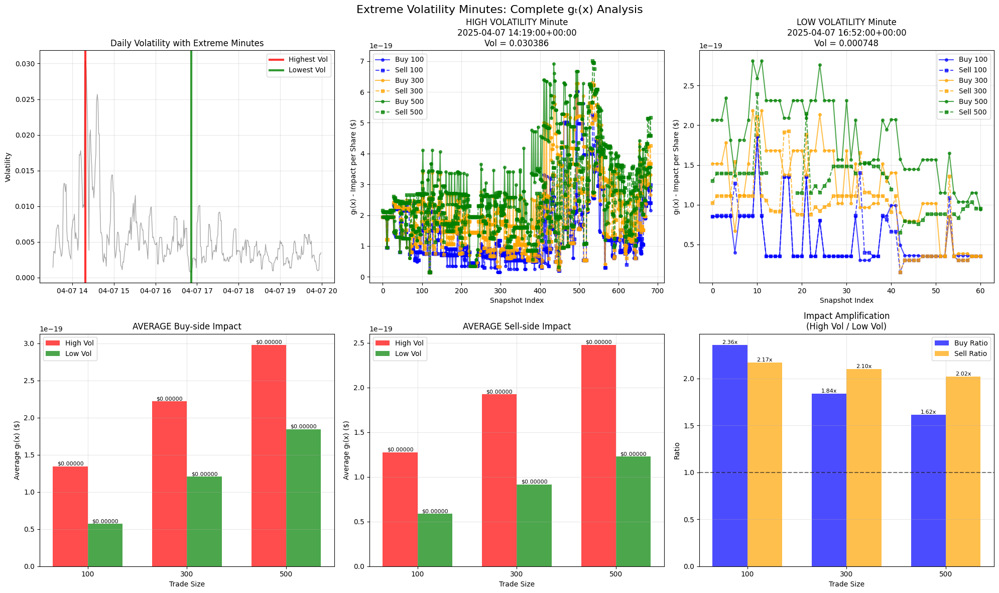


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-07 14:19:00+00:00
Volatility: 0.030386
Number of snapshots: 683

LOWEST VOLATILITY MINUTE: 2025-04-07 16:52:00+00:00
Volatility: 0.000748
Number of snapshots: 61

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.36x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.17x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.84x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.10x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.62x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.02x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000333 to 0.017159

Highest Volatility Minute: 2025-04-08 13:36:00+00:00
Volatility: 0

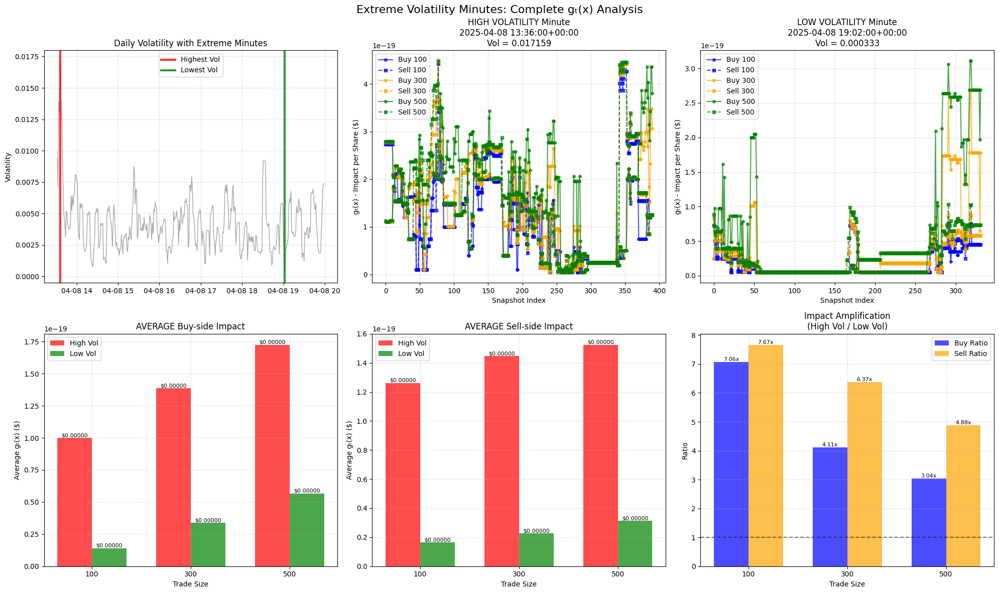


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-08 13:36:00+00:00
Volatility: 0.017159
Number of snapshots: 391

LOWEST VOLATILITY MINUTE: 2025-04-08 19:02:00+00:00
Volatility: 0.000333
Number of snapshots: 332

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 7.06x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 7.67x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.11x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 6.37x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.04x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.88x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000728 to 0.028646

Highest Volatility Minute: 2025-04-09 17:28:00+00:00
Volatility: 

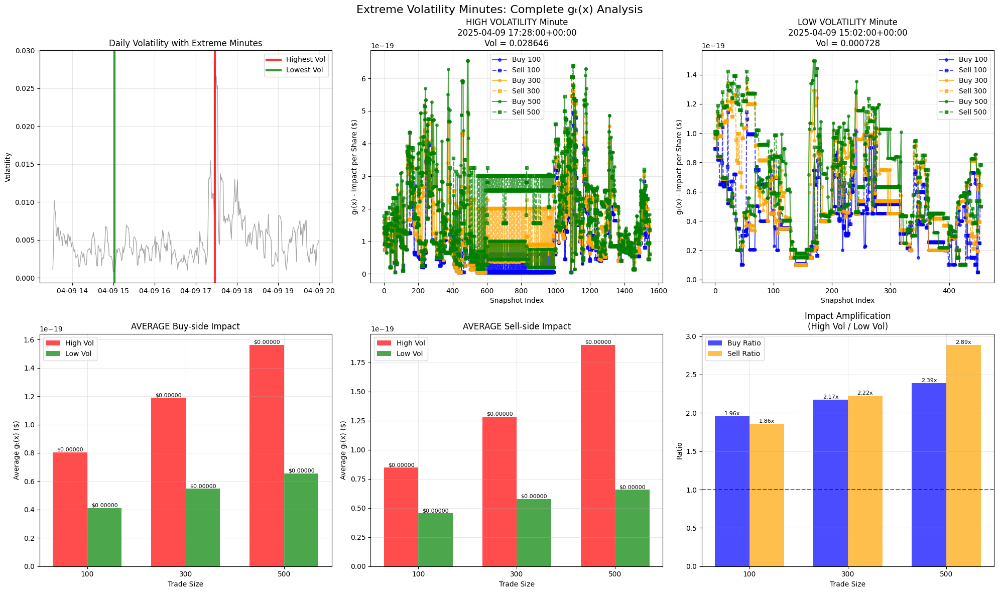


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-09 17:28:00+00:00
Volatility: 0.028646
Number of snapshots: 1548

LOWEST VOLATILITY MINUTE: 2025-04-09 15:02:00+00:00
Volatility: 0.000728
Number of snapshots: 455

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.96x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.86x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.17x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.22x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.39x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.89x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000594 to 0.020778

Highest Volatility Minute: 2025-04-10 13:32:00+00:00
Volatility:

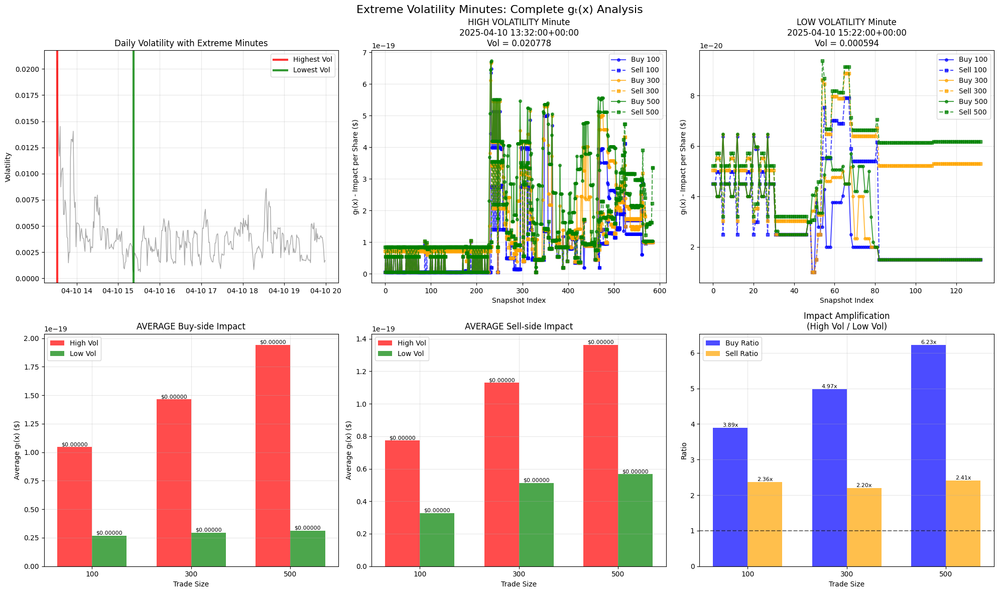


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-10 13:32:00+00:00
Volatility: 0.020778
Number of snapshots: 586

LOWEST VOLATILITY MINUTE: 2025-04-10 15:22:00+00:00
Volatility: 0.000594
Number of snapshots: 133

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.89x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.36x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.97x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.20x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 6.23x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.41x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000480 to 0.015063

Highest Volatility Minute: 2025-04-11 13:32:00+00:00
Volatility: 

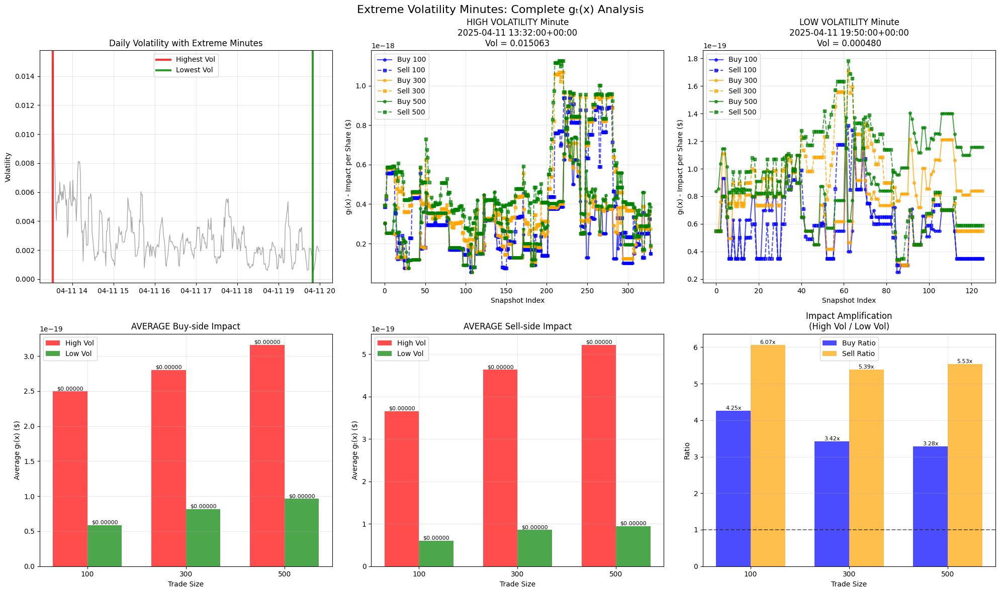


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-11 13:32:00+00:00
Volatility: 0.015063
Number of snapshots: 329

LOWEST VOLATILITY MINUTE: 2025-04-11 19:50:00+00:00
Volatility: 0.000480
Number of snapshots: 126

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.25x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 6.07x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.42x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 5.39x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.28x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 5.53x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 387 minutes
Volatility range: 0.000216 to 0.020455

Highest Volatility Minute: 2025-04-14 13:32:00+00:00
Volatility: 

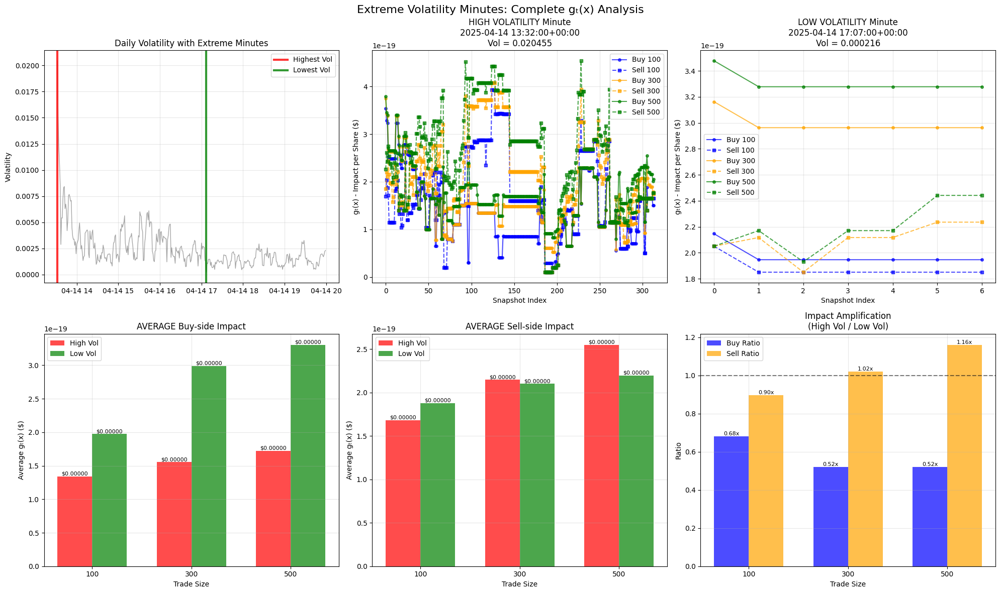


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-14 13:32:00+00:00
Volatility: 0.020455
Number of snapshots: 314

LOWEST VOLATILITY MINUTE: 2025-04-14 17:07:00+00:00
Volatility: 0.000216
Number of snapshots: 7

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.68x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.90x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.52x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.02x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.52x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.16x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000207 to 0.010668

Highest Volatility Minute: 2025-04-15 14:37:00+00:00
Volatility: 0.

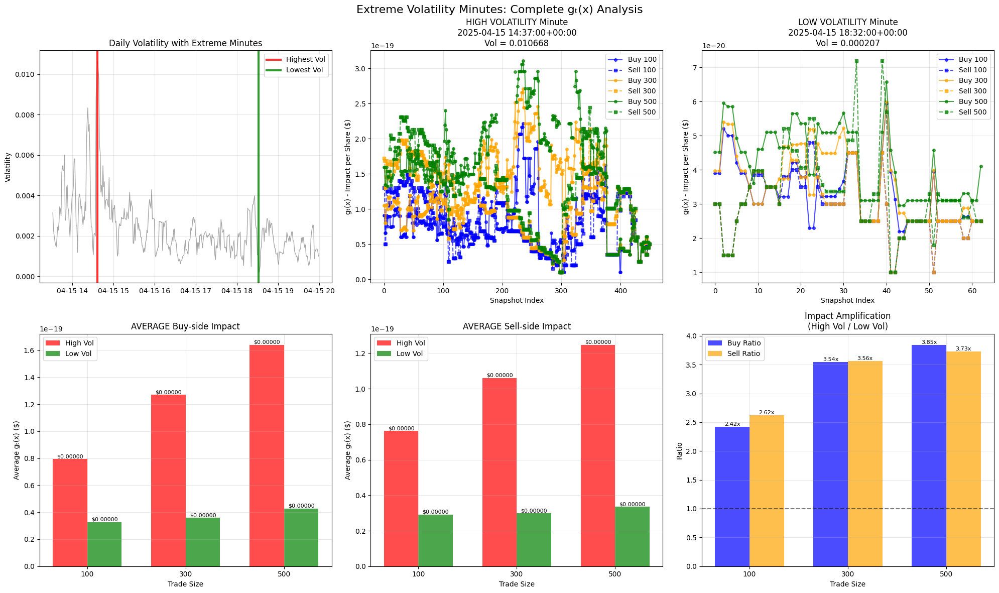


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-15 14:37:00+00:00
Volatility: 0.010668
Number of snapshots: 450

LOWEST VOLATILITY MINUTE: 2025-04-15 18:32:00+00:00
Volatility: 0.000207
Number of snapshots: 63

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.42x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.62x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.54x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.56x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.85x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.73x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000284 to 0.014119

Highest Volatility Minute: 2025-04-16 13:33:00+00:00
Volatility: 0

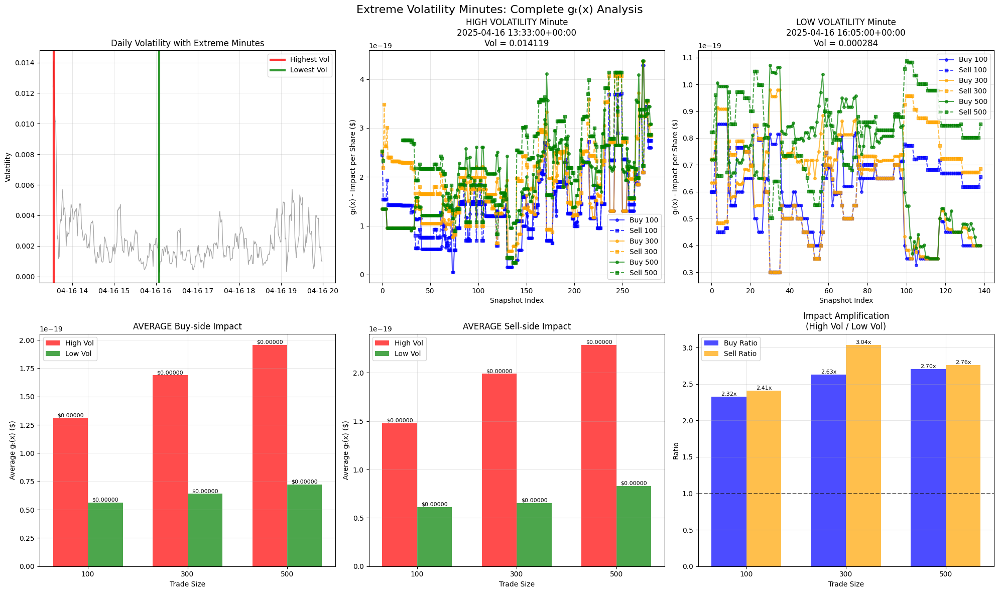


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-16 13:33:00+00:00
Volatility: 0.014119
Number of snapshots: 281

LOWEST VOLATILITY MINUTE: 2025-04-16 16:05:00+00:00
Volatility: 0.000284
Number of snapshots: 139

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.32x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.41x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.63x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.04x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.70x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.76x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000000 to 0.010579

Highest Volatility Minute: 2025-04-17 13:43:00+00:00
Volatility: 

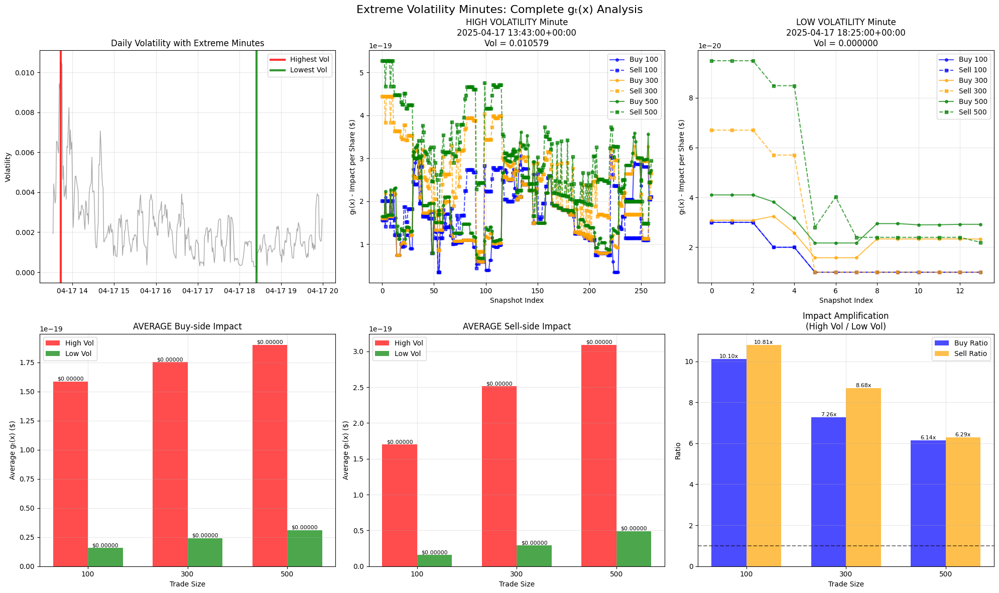


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-17 13:43:00+00:00
Volatility: 0.010579
Number of snapshots: 261

LOWEST VOLATILITY MINUTE: 2025-04-17 18:25:00+00:00
Volatility: 0.000000
Number of snapshots: 14

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 10.10x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 10.81x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 7.26x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 8.68x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 6.14x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 6.29x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000371 to 0.006684

Highest Volatility Minute: 2025-04-21 16:07:00+00:00
Volatility:

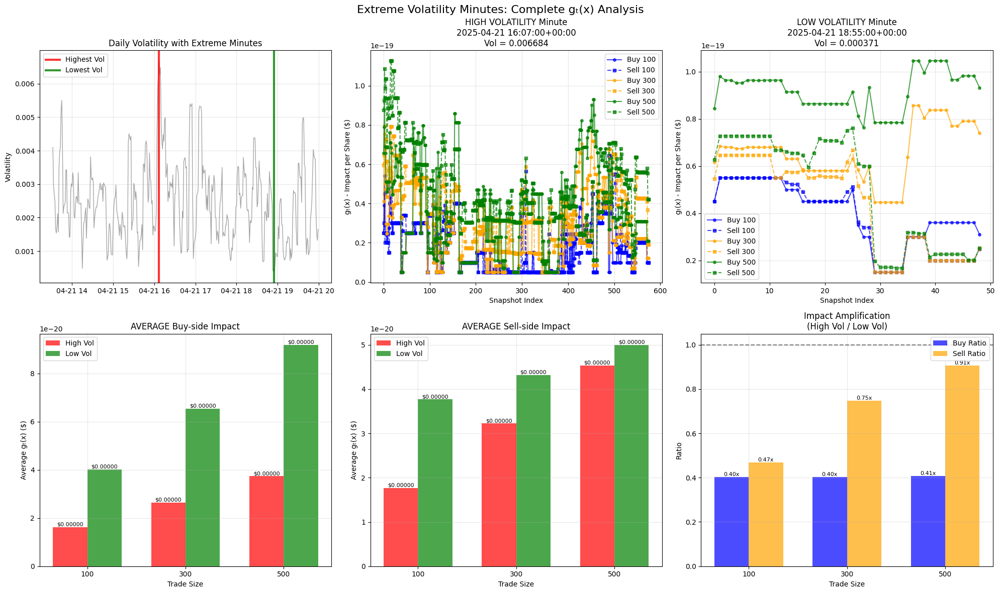


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-21 16:07:00+00:00
Volatility: 0.006684
Number of snapshots: 576

LOWEST VOLATILITY MINUTE: 2025-04-21 18:55:00+00:00
Volatility: 0.000371
Number of snapshots: 49

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.40x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.47x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.40x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.75x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.41x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.91x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000202 to 0.007688

Highest Volatility Minute: 2025-04-22 13:58:00+00:00
Volatility: 0

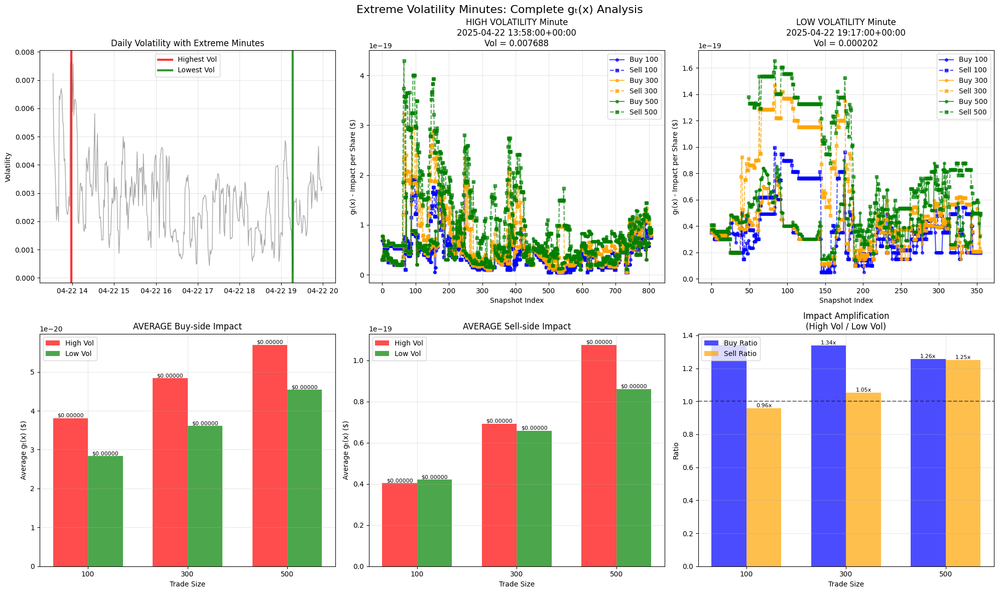


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-22 13:58:00+00:00
Volatility: 0.007688
Number of snapshots: 808

LOWEST VOLATILITY MINUTE: 2025-04-22 19:17:00+00:00
Volatility: 0.000202
Number of snapshots: 356

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.34x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 0.96x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.34x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.05x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.26x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.25x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000221 to 0.010828

Highest Volatility Minute: 2025-04-23 13:33:00+00:00
Volatility: 

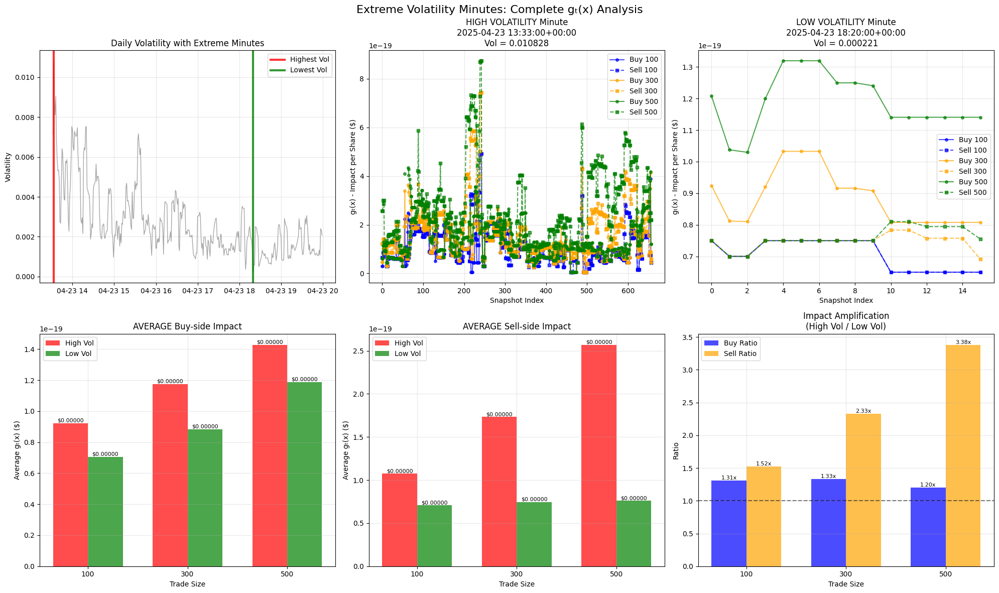


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-23 13:33:00+00:00
Volatility: 0.010828
Number of snapshots: 658

LOWEST VOLATILITY MINUTE: 2025-04-23 18:20:00+00:00
Volatility: 0.000221
Number of snapshots: 16

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.31x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.52x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.33x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.33x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.20x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.38x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000100 to 0.012973

Highest Volatility Minute: 2025-04-24 13:32:00+00:00
Volatility: 0

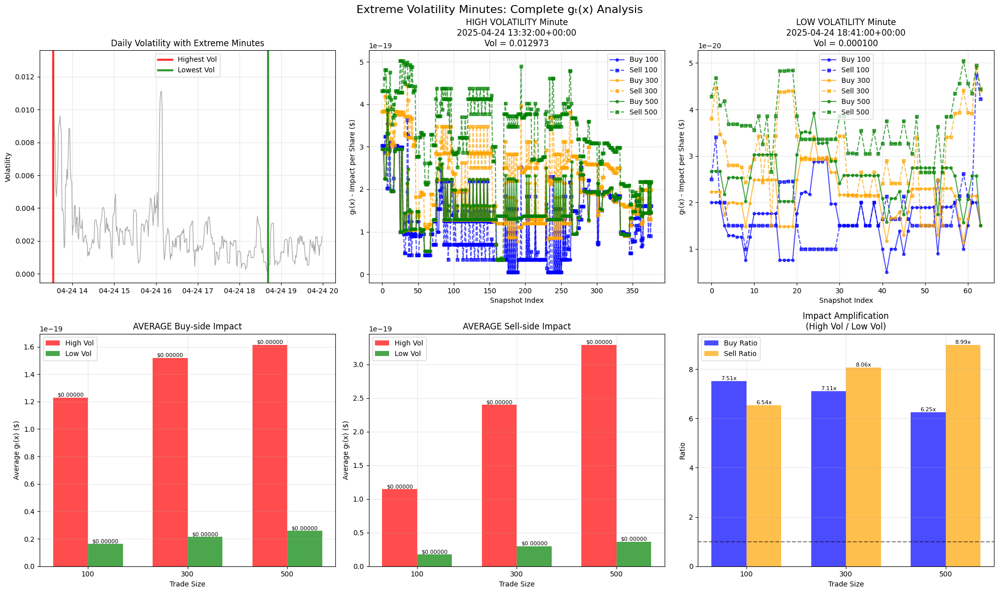


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-24 13:32:00+00:00
Volatility: 0.012973
Number of snapshots: 377

LOWEST VOLATILITY MINUTE: 2025-04-24 18:41:00+00:00
Volatility: 0.000100
Number of snapshots: 64

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 7.51x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 6.54x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 7.11x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 8.06x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 6.25x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 8.99x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000130 to 0.009368

Highest Volatility Minute: 2025-04-25 14:11:00+00:00
Volatility: 0

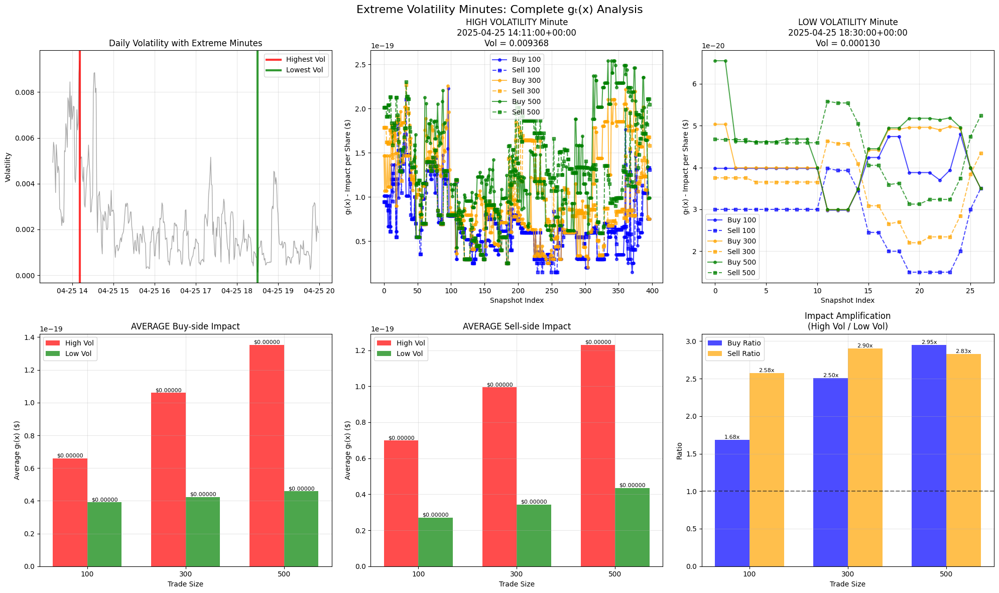


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-25 14:11:00+00:00
Volatility: 0.009368
Number of snapshots: 397

LOWEST VOLATILITY MINUTE: 2025-04-25 18:30:00+00:00
Volatility: 0.000130
Number of snapshots: 27

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.68x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.58x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.50x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.90x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.95x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.83x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000221 to 0.010599

Highest Volatility Minute: 2025-04-28 13:33:00+00:00
Volatility: 0

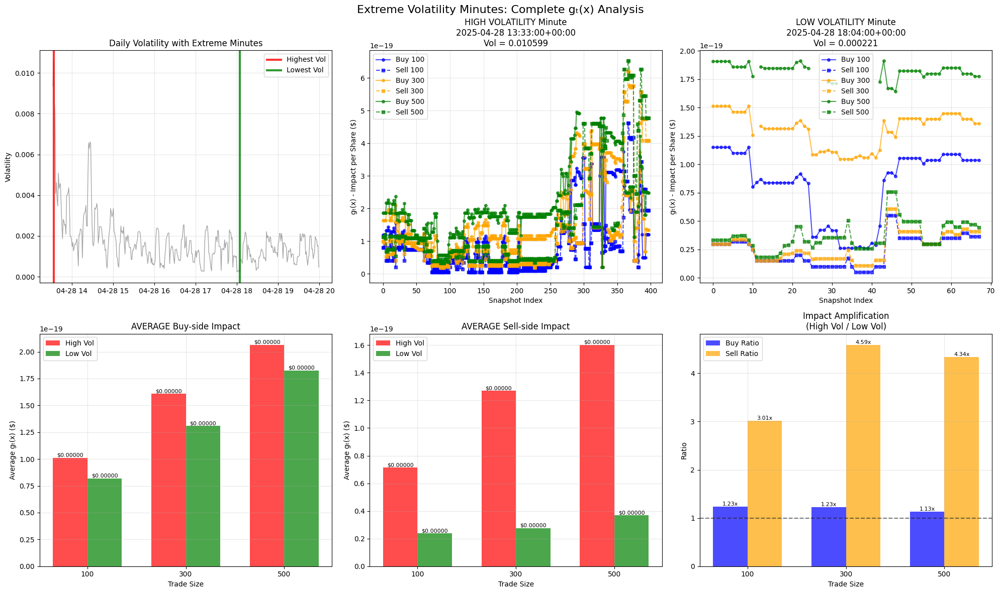


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-28 13:33:00+00:00
Volatility: 0.010599
Number of snapshots: 398

LOWEST VOLATILITY MINUTE: 2025-04-28 18:04:00+00:00
Volatility: 0.000221
Number of snapshots: 68

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.23x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.01x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.23x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.59x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.13x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.34x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000250 to 0.011294

Highest Volatility Minute: 2025-04-29 14:22:00+00:00
Volatility: 0

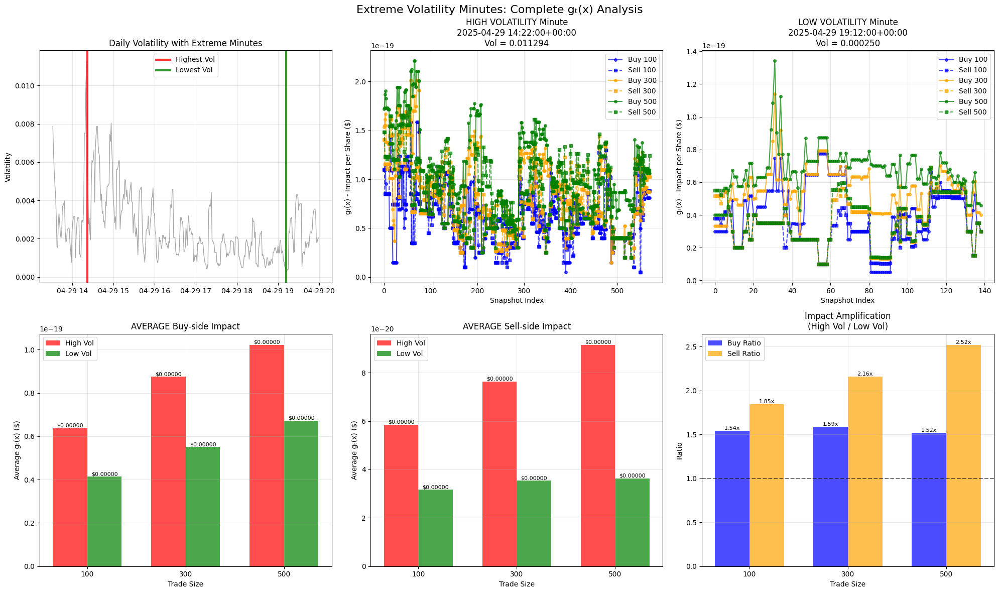


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-29 14:22:00+00:00
Volatility: 0.011294
Number of snapshots: 570

LOWEST VOLATILITY MINUTE: 2025-04-29 19:12:00+00:00
Volatility: 0.000250
Number of snapshots: 139

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.54x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.85x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.59x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.16x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.52x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.52x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000185 to 0.013701

Highest Volatility Minute: 2025-04-30 13:32:00+00:00
Volatility: 

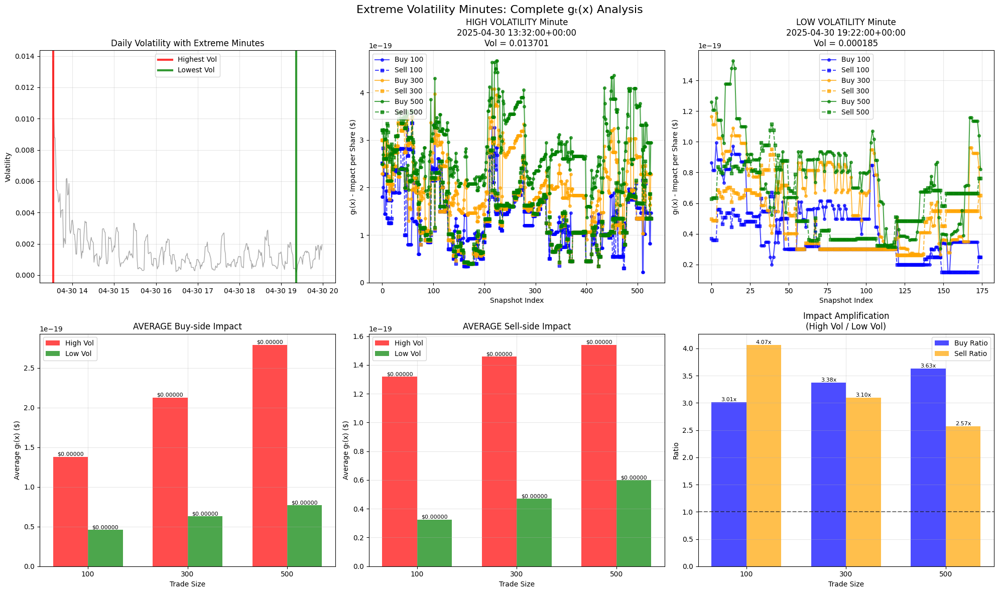


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-04-30 13:32:00+00:00
Volatility: 0.013701
Number of snapshots: 528

LOWEST VOLATILITY MINUTE: 2025-04-30 19:22:00+00:00
Volatility: 0.000185
Number of snapshots: 175

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.01x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.07x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.38x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.10x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.63x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.57x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000400 to 0.019640

Highest Volatility Minute: 2025-05-01 13:33:00+00:00
Volatility: 

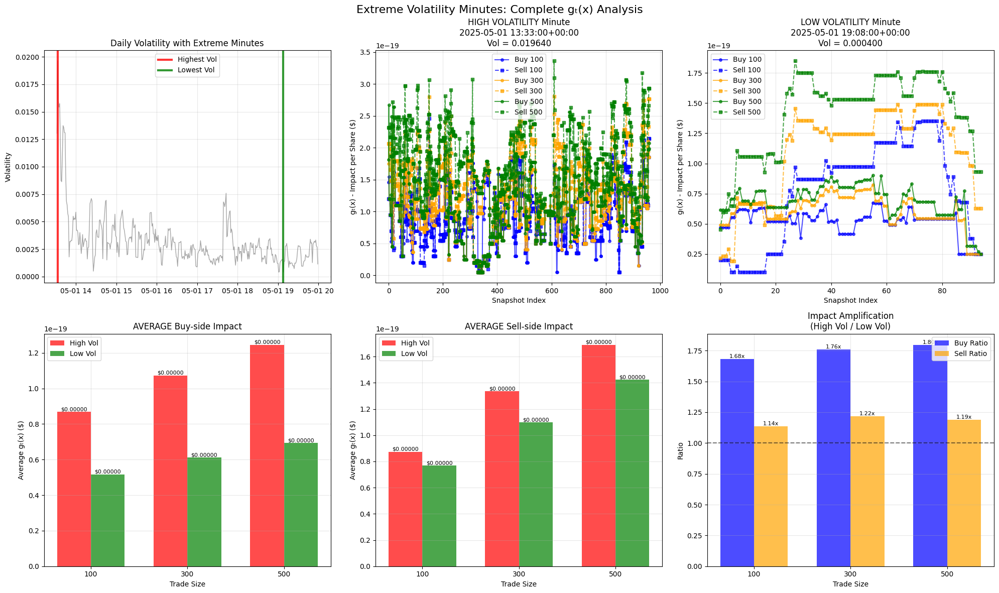


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-05-01 13:33:00+00:00
Volatility: 0.019640
Number of snapshots: 961

LOWEST VOLATILITY MINUTE: 2025-05-01 19:08:00+00:00
Volatility: 0.000400
Number of snapshots: 95

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.68x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.14x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.76x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.22x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.80x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.19x
Loading data...
Analyzing Extreme Volatility Minutes
Step 1: Calculating minute-by-minute volatility...
Calculated volatility for 388 minutes
Volatility range: 0.000181 to 0.008964

Highest Volatility Minute: 2025-05-02 13:57:00+00:00
Volatility: 0

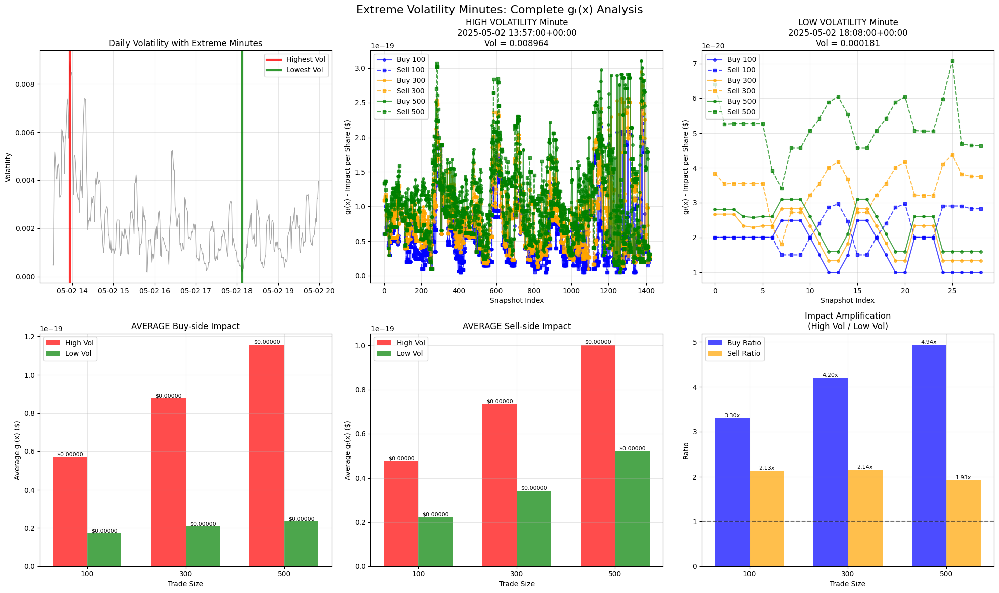


DETAILED RESULTS: EXTREME VOLATILITY MINUTES

HIGHEST VOLATILITY MINUTE: 2025-05-02 13:57:00+00:00
Volatility: 0.008964
Number of snapshots: 1420

LOWEST VOLATILITY MINUTE: 2025-05-02 18:08:00+00:00
Volatility: 0.000181
Number of snapshots: 29

AVERAGE IMPACT COMPARISON:
--------------------------------------------------

Trade Size 100:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 3.30x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.13x

Trade Size 300:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.20x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 2.14x

Trade Size 500:
  Buy  - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 4.94x
  Sell - High Vol: $0.000000, Low Vol: $0.000000, Ratio: 1.93x
                                  file  trade_size  buy_ratio  sell_ratio
0   CRWV_2025-04-03 00:00:00+00:00.csv         100   1.506529    1.253057
1   CRWV_2025-04-03 00:00:00+00:00.csv         300   2.448843    1.096111
2   CRWV_2025-04-03 00:00

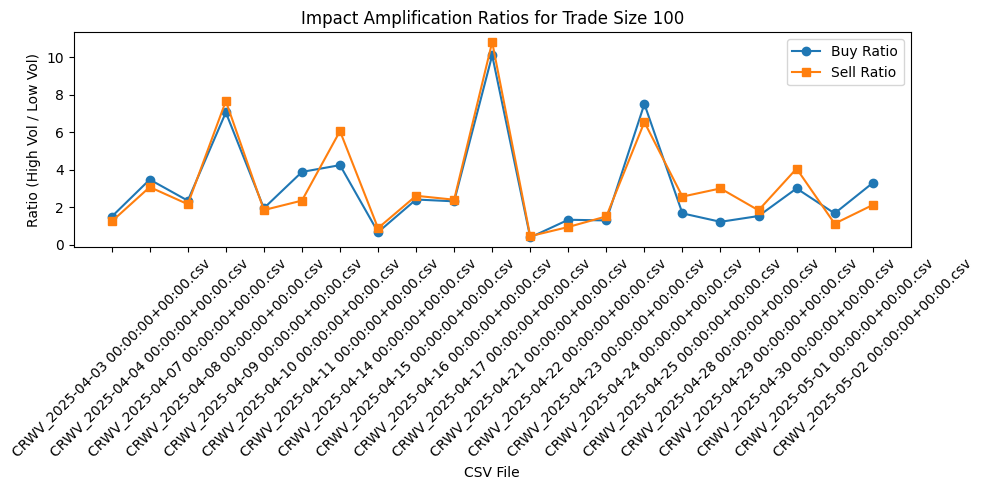

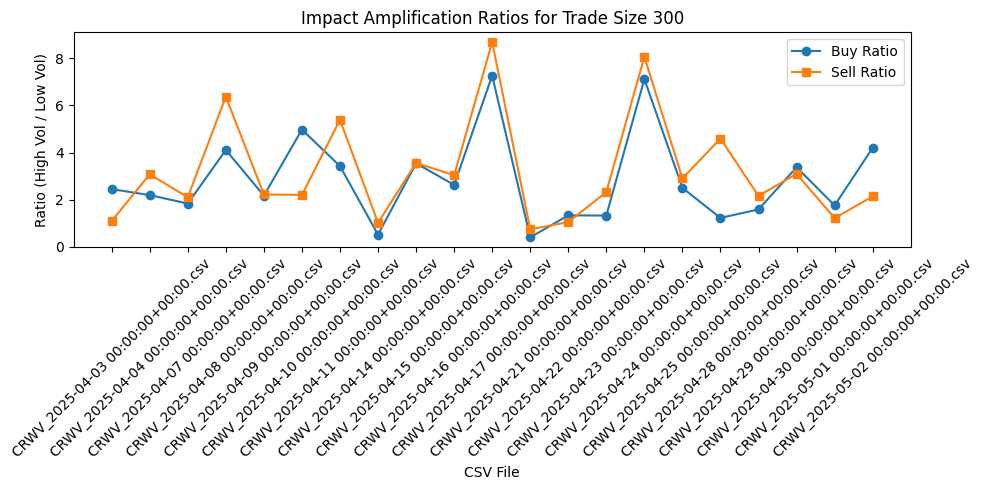

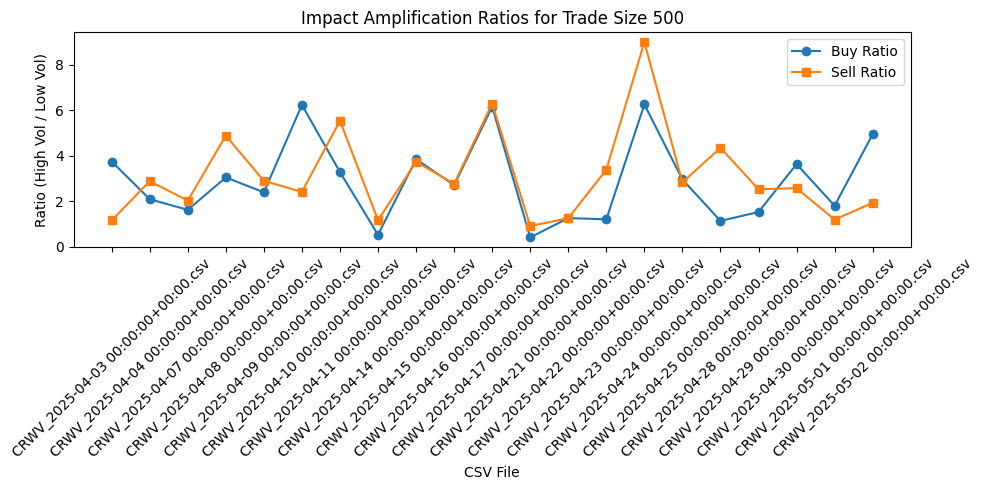

In [15]:
import os
import glob
import pandas as pd
import numpy as np

def get_ratios_from_results(results):
    trade_sizes = results['trade_sizes']
    high_buy_avgs = [results['high_vol_avg'][f'buy_{size}'] for size in trade_sizes]
    low_buy_avgs = [results['low_vol_avg'][f'buy_{size}'] for size in trade_sizes]
    high_sell_avgs = [results['high_vol_avg'][f'sell_{size}'] for size in trade_sizes]
    low_sell_avgs = [results['low_vol_avg'][f'sell_{size}'] for size in trade_sizes]
    buy_ratios = [h/l if l > 0 and not np.isnan(h) and not np.isnan(l) else np.nan 
                  for h, l in zip(high_buy_avgs, low_buy_avgs)]
    sell_ratios = [h/l if l > 0 and not np.isnan(h) and not np.isnan(l) else np.nan 
                   for h, l in zip(high_sell_avgs, low_sell_avgs)]
    return trade_sizes, buy_ratios, sell_ratios

folder = "CRWV"
csv_files = sorted(glob.glob(os.path.join(folder, "*.csv")))

summary = []

for csv_file in csv_files:
    try:
        results = run_extreme_volatility_analysis(csv_file)
        trade_sizes, buy_ratios, sell_ratios = get_ratios_from_results(results)
        summary.append({
            "file": os.path.basename(csv_file),
            "trade_sizes": trade_sizes,
            "buy_ratios": buy_ratios,
            "sell_ratios": sell_ratios
        })
    except Exception as e:
        print(f"Error processing {csv_file}: {e}")

# Create a DataFrame for comparison
rows = []
for item in summary:
    for i, size in enumerate(item["trade_sizes"]):
        rows.append({
            "file": item["file"],
            "trade_size": size,
            "buy_ratio": item["buy_ratios"][i],
            "sell_ratio": item["sell_ratios"][i]
        })

df_ratios = pd.DataFrame(rows)
print(df_ratios)

# Optional: plot comparison for each trade size
import matplotlib.pyplot as plt

for size in df_ratios['trade_size'].unique():
    subset = df_ratios[df_ratios['trade_size'] == size]
    plt.figure(figsize=(10, 5))
    plt.plot(subset['file'], subset['buy_ratio'], marker='o', label='Buy Ratio')
    plt.plot(subset['file'], subset['sell_ratio'], marker='s', label='Sell Ratio')
    plt.title(f'Impact Amplification Ratios for Trade Size {size}')
    plt.xlabel('CSV File')
    plt.ylabel('Ratio (High Vol / Low Vol)')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

As we see other factors also play a role here as sometimes the amplification ratios are relatively in the same area

In [18]:
%pip install statsmodels
import statsmodels.api as sm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 11.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [statsmodels] [statsmodels]
Note: you may need to restart the kernel to use updated packages.


In [19]:
from statsmodels.tsa.stattools import adfuller

# Combine all buy and sell ratios for stationarity test
all_buy_ratios = [row['buy_ratio'] for row in rows]
all_sell_ratios = [row['sell_ratio'] for row in rows]

# ADF test for buy ratios
adf_buy = adfuller(all_buy_ratios)
print("ADF Test for Buy Impact Amplification Ratios")
print(f"ADF Statistic: {adf_buy[0]:.4f}")
print(f"p-value: {adf_buy[1]:.4f}")
print(f"Critical Values: {adf_buy[4]}")

# ADF test for sell ratios
adf_sell = adfuller(all_sell_ratios)
print("\nADF Test for Sell Impact Amplification Ratios")
print(f"ADF Statistic: {adf_sell[0]:.4f}")
print(f"p-value: {adf_sell[1]:.4f}")
print(f"Critical Values: {adf_sell[4]}")

ADF Test for Buy Impact Amplification Ratios
ADF Statistic: -5.2931
p-value: 0.0000
Critical Values: {'1%': np.float64(-3.55770911573439), '5%': np.float64(-2.9167703434435808), '10%': np.float64(-2.59622219478738)}

ADF Test for Sell Impact Amplification Ratios
ADF Statistic: -3.7963
p-value: 0.0029
Critical Values: {'1%': np.float64(-3.5506699942762414), '5%': np.float64(-2.913766394626147), '10%': np.float64(-2.5946240473991997)}


Thus the values give stationarity which means their mean are sort of constant, thus deterministic values of c can be ranged.